# Task 2
## Visualize the raw GPS points of the first 15 trips in the trajectory data dataset on a map with the road network of Porto (together with different colors or separately).

### Requirements setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
!pip install osmnx

In [ ]:
ls drive/MyDrive/urban_project2/

cache/                                         task1.ipynb
data/                                          task3.ipynb
output_task1/                                  task5.ipynb
output_task3/                                  testing/
output_task5/                                  train_1500_test2.geojson
pkdd-15-predict-taxi-service-trajectory-i.zip  train_1500_w_outlier.geojson


In [ ]:
root_dir = "drive/MyDrive/urban_project2/"

In [ ]:
import pandas as pd
import osmnx as ox
import ast
import matplotlib.pyplot as plt
import numpy as np

### Loading data for first 15 trips

In [ ]:
train_data = pd.read_csv(root_dir + "/data/train_1500.csv")

In [ ]:
train_data

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,1372636858620000589,C,NaN,NaN,20000589,1372636858,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[..."
1,1372637303620000596,B,NaN,7.0,20000596,1372637303,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[..."
2,1372636951620000320,C,NaN,NaN,20000320,1372636951,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-..."
3,1372636854620000520,C,NaN,NaN,20000520,1372636854,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[..."
4,1372637091620000337,C,NaN,NaN,20000337,1372637091,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-..."
...,...,...,...,...,...,...,...,...,...
1495,1372672434620000051,B,NaN,44.0,20000051,1372672434,A,False,"[[-8.625447,41.149332],[-8.625429,41.149323],[..."
1496,1372674326620000557,B,NaN,13.0,20000557,1372674326,A,False,"[[-8.62839,41.15718],[-8.628183,41.15736],[-8...."
1497,1372672055620000653,B,NaN,18.0,20000653,1372672055,A,False,"[[-8.619777,41.148018],[-8.620056,41.147793],[..."
1498,1372673543620000598,C,NaN,NaN,20000598,1372673543,A,False,"[[-8.58654,41.148999],[-8.587233,41.149125],[-..."


In [ ]:
df = train_data.head(15)

In [ ]:
df

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,1372636858620000589,C,NaN,NaN,20000589,1372636858,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[..."
1,1372637303620000596,B,NaN,7.0,20000596,1372637303,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[..."
2,1372636951620000320,C,NaN,NaN,20000320,1372636951,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-..."
3,1372636854620000520,C,NaN,NaN,20000520,1372636854,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[..."
4,1372637091620000337,C,NaN,NaN,20000337,1372637091,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-..."
5,1372636965620000231,C,NaN,NaN,20000231,1372636965,A,False,"[[-8.615502,41.140674],[-8.614854,41.140926],[..."
6,1372637210620000456,C,NaN,NaN,20000456,1372637210,A,False,"[[-8.57952,41.145948],[-8.580942,41.145039],[-..."
7,1372637299620000011,C,NaN,NaN,20000011,1372637299,A,False,"[[-8.617563,41.146182],[-8.617527,41.145849],[..."
8,1372637274620000403,C,NaN,NaN,20000403,1372637274,A,False,"[[-8.611794,41.140557],[-8.611785,41.140575],[..."
9,1372637905620000320,C,NaN,NaN,20000320,1372637905,A,False,"[[-8.615907,41.140557],[-8.614449,41.141088],[..."


### Parsing the data

In [ ]:
# expanding polyline column

new_data = []
for x, row in df.iterrows():
  trip_id = row["TRIP_ID"]

  if row["POLYLINE"]:
    # converting string value to list
    coordinates = ast.literal_eval(row["POLYLINE"])
    if coordinates:
      for i in coordinates:
        # storing each longitude and latitude of a trip id into multiple rows
        # each trip id has multiple rows of raw gps point
        new_data.append({"trip_id" : trip_id, "lon" : i[0], "lat" : i[1]})

updated_df = pd.DataFrame(new_data)

In [ ]:
updated_df

,trip_id,lon,lat
0,1372636858620000589,-8.618643,41.141412
1,1372636858620000589,-8.618499,41.141376
2,1372636858620000589,-8.620326,41.142510
3,1372636858620000589,-8.622153,41.143815
4,1372636858620000589,-8.623953,41.144373
...,...,...,...
487,1372638151620000231,-8.609328,41.155056
488,1372638151620000231,-8.609238,41.156847
489,1372638151620000231,-8.608401,41.157477
490,1372638151620000231,-8.607276,41.157657


In [ ]:
len(updated_df["trip_id"].unique())

15

### Visualization

In [ ]:
G1 = ox.graph_from_place("Porto", network_type='drive', which_result=1)

(<Figure size 1500x1500 with 1 Axes>, <Axes: >)

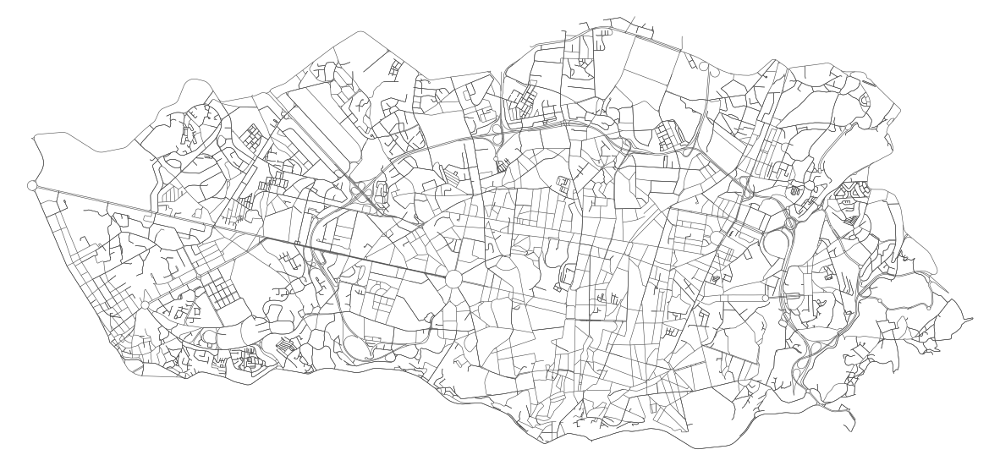

In [ ]:
# testing to see and load the road map for Porto
fig, ax = plt.subplots(figsize=(15, 15))
ox.plot_graph(
    G1,
    ax=ax,
    node_size=0,
    edge_color="#444444",
    edge_linewidth=0.4,
    bgcolor="white",
    show=False,
    close=False,
)

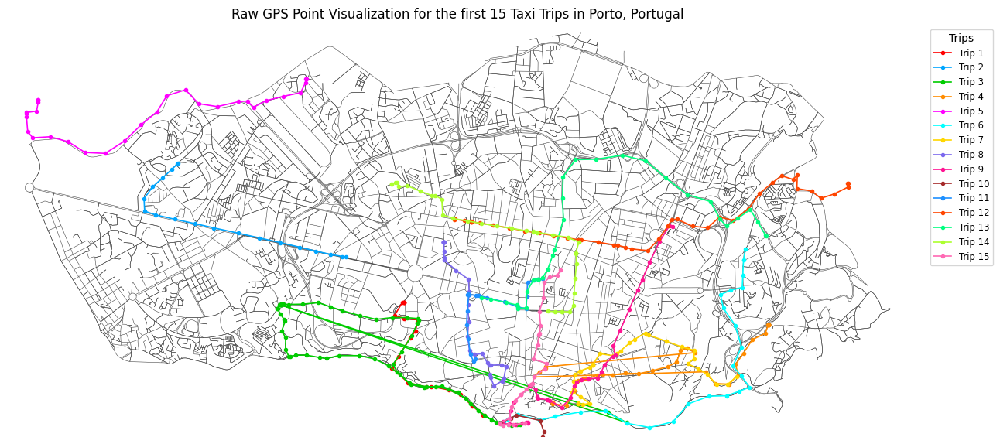

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))

# loading map for Porto
ox.plot_graph(
    G1,
    ax=ax,
    node_size=0,
    edge_color="#444444",
    edge_linewidth=0.4,
    bgcolor="white",
    show=False,
    close=False,
)

trip_ids = updated_df["trip_id"].unique()

# custom color for each trip
colors = [
    "#FF0000", "#00A6FF", "#00CC00", "#FF8C00", "#FF00FF",
    "#00FFFF", "#FFD700", "#7B68EE", "#FF1493", "#A52A2A",
    "#1E90FF", "#FF4500", "#00FF7F", "#ADFF2F", "#FF69B4"
]

# plotting each trip iteratively
i = 1
for color, trip in zip(colors, trip_ids):
    trip_points = updated_df[updated_df["trip_id"] == trip]

    ax.plot(
        trip_points["lon"],
        trip_points["lat"],
        marker='o',
        markersize=3,
        linewidth=1.2,
        color=color,
        label=f"Trip {i}"
    )
    i = i + 1

plt.legend(title="Trips", loc='upper right', fontsize='small', bbox_to_anchor=(1.1, 1))
plt.title("Raw GPS Point Visualization for the first 15 Taxi Trips in Porto, Portugal")
plt.show()

### Visulaization on a larger map
#### This larger road network offers better coverage in future tasks, but is not optimal for visualization purposes

In [ ]:
G2 = ox.graph_from_place("Porto", network_type='drive', which_result=2)

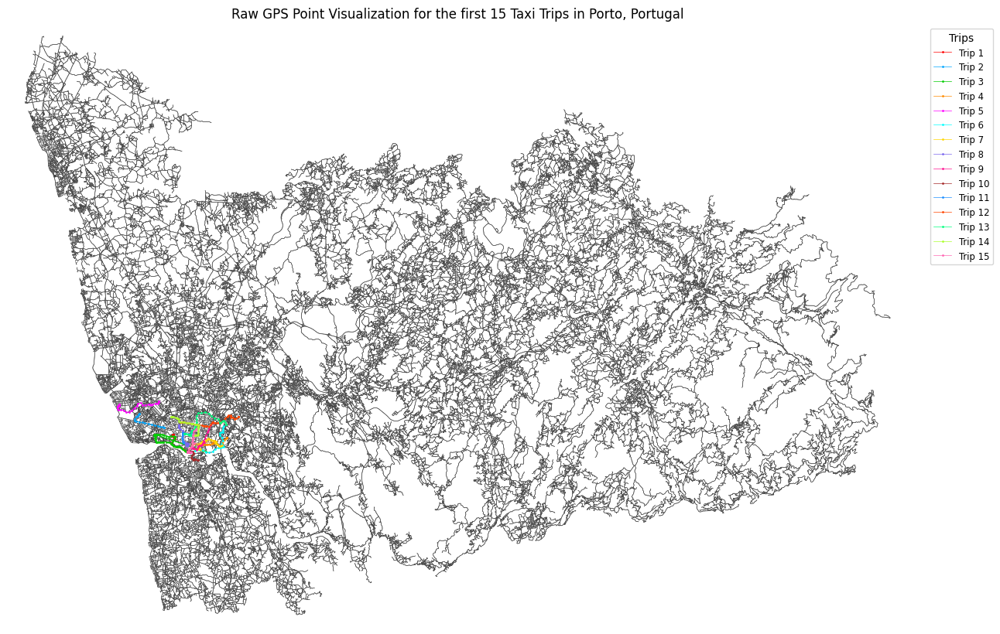

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
ox.plot_graph(
    G2,
    ax=ax,
    node_size=0,
    edge_color="#444444",
    edge_linewidth=0.4,
    bgcolor="white",
    show=False,
    close=False,
)

trip_ids = updated_df["trip_id"].unique()

# using the same custom colors list
colors = [
    "#FF0000", "#00A6FF", "#00CC00", "#FF8C00", "#FF00FF",
    "#00FFFF", "#FFD700", "#7B68EE", "#FF1493", "#A52A2A",
    "#1E90FF", "#FF4500", "#00FF7F", "#ADFF2F", "#FF69B4"
]

# plotting for each trip iteratively
i = 1
for color, trip in zip(colors, trip_ids):
    trip_points = updated_df[updated_df["trip_id"] == trip]

    ax.plot(
        trip_points["lon"],
        trip_points["lat"],
        marker='o',
        markersize=1,
        linewidth=0.5,
        color=color,
        label=f"Trip {i}"
    )
    i = i + 1

plt.legend(title="Trips", loc='upper right', fontsize='small', bbox_to_anchor=(1.1, 1))
plt.title("Raw GPS Point Visualization for the first 15 Taxi Trips in Porto, Portugal")
plt.show()

### Visualizing each individual trip

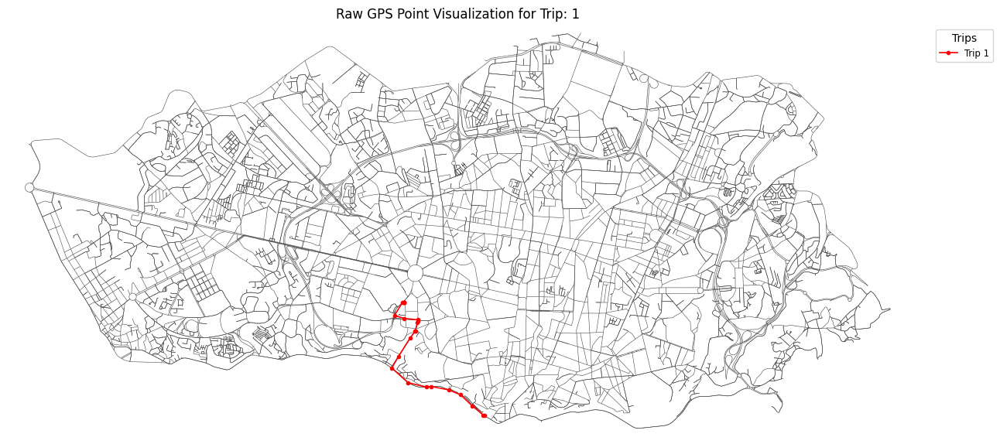

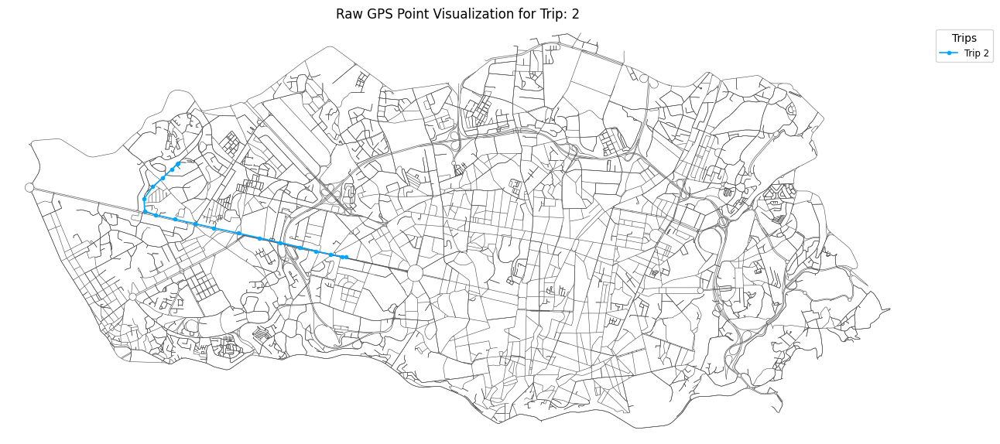

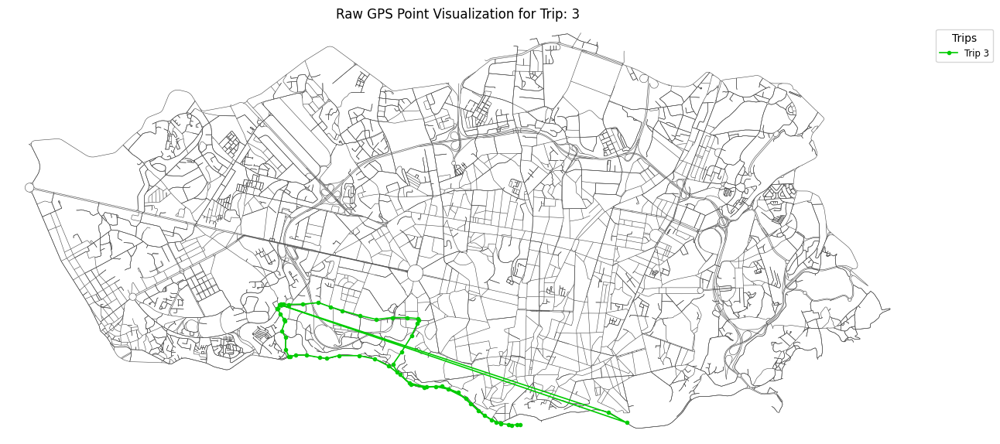

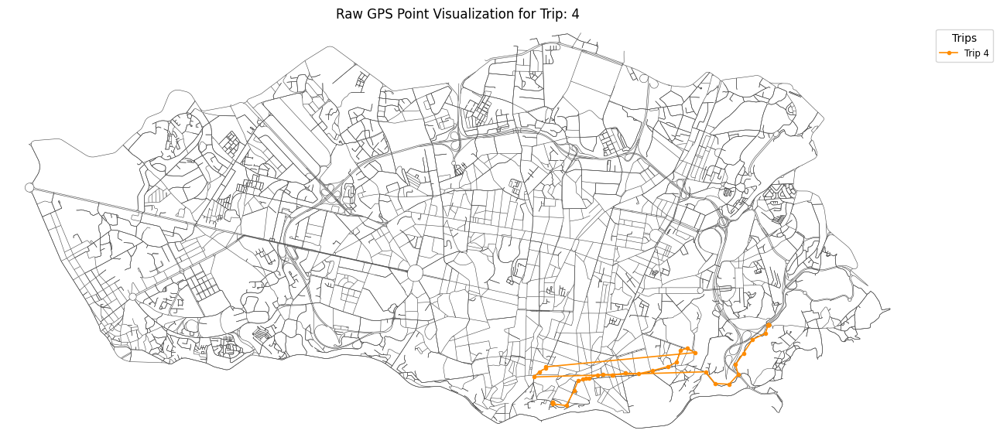

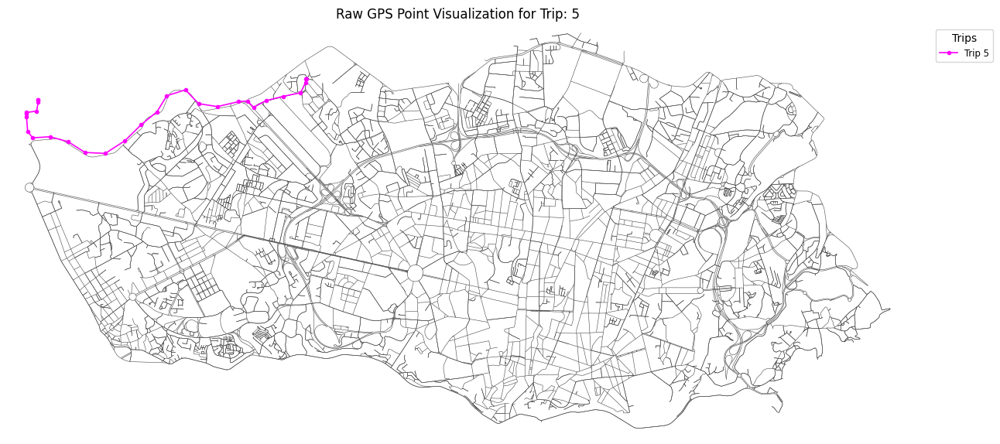

...

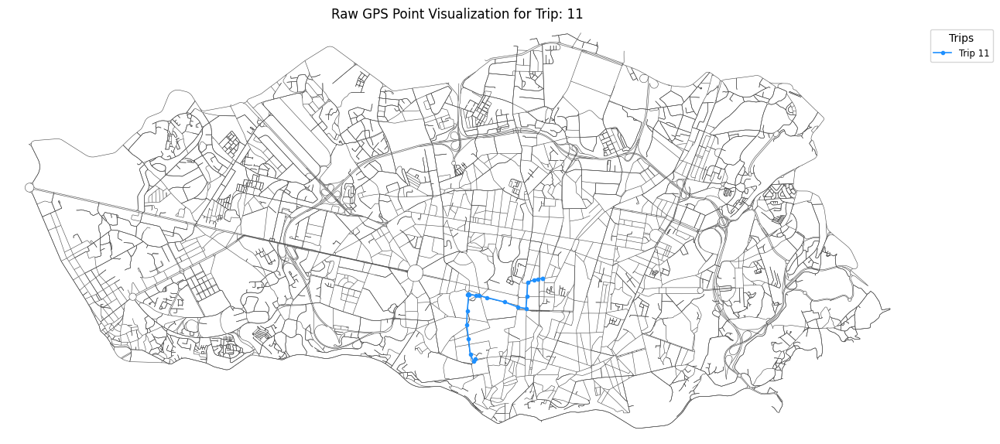

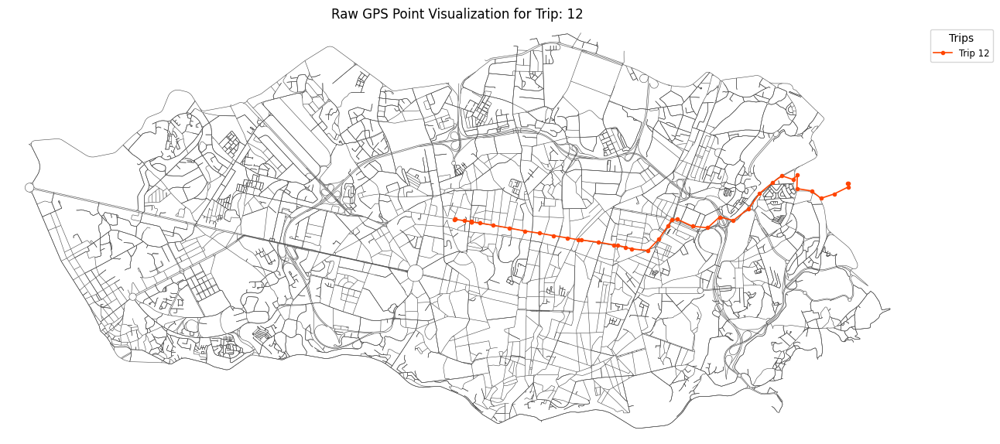

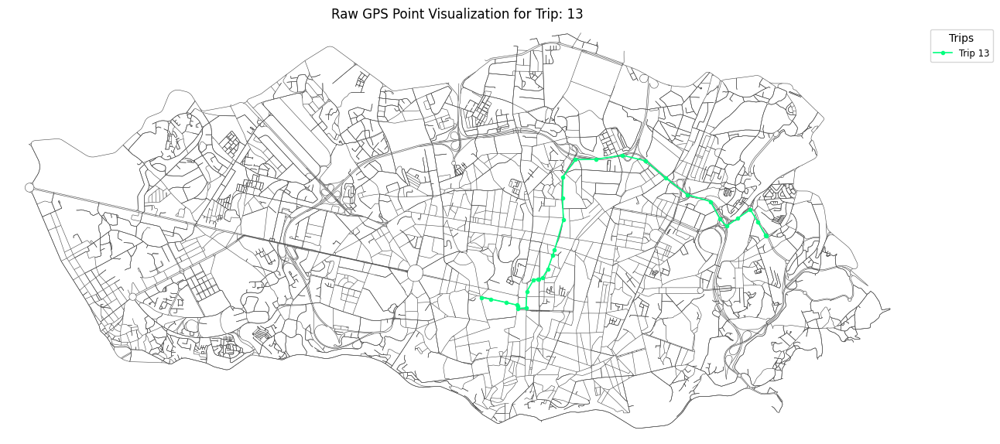

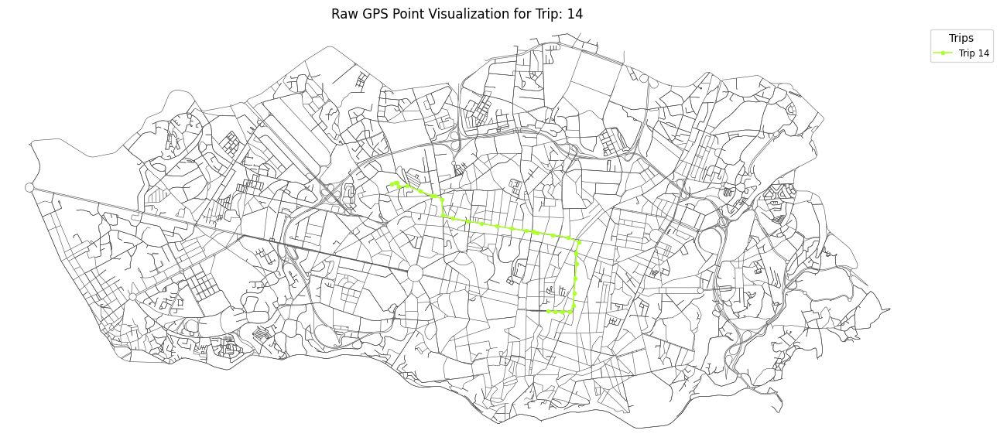

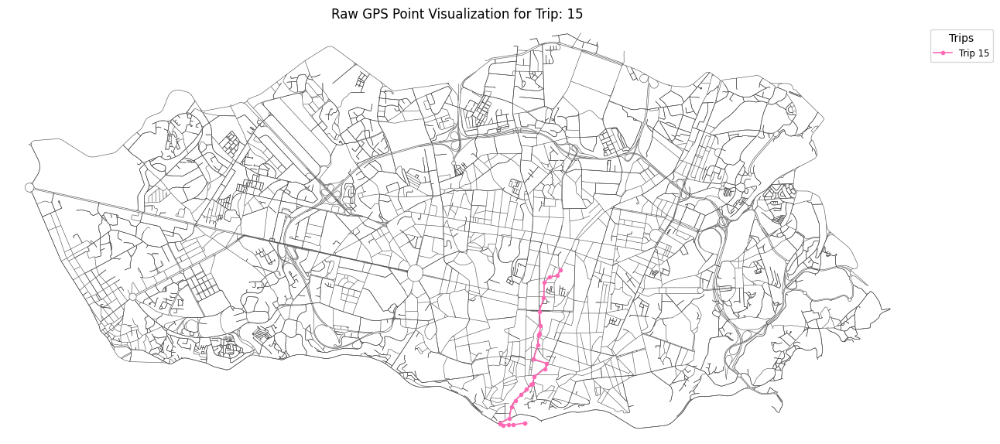

In [ ]:
trip_ids = updated_df["trip_id"].unique()

# custom color for each trip
colors = [
    "#FF0000", "#00A6FF", "#00CC00", "#FF8C00", "#FF00FF",
    "#00FFFF", "#FFD700", "#7B68EE", "#FF1493", "#A52A2A",
    "#1E90FF", "#FF4500", "#00FF7F", "#ADFF2F", "#FF69B4"
]

# plotting each trip iteratively in an individual plot for analysis
i = 1
for color, trip in zip(colors, trip_ids):
    fig, ax = plt.subplots(figsize=(15, 15))

    ox.plot_graph(
        G1,
        ax=ax,
        node_size=0,
        edge_color="#444444",
        edge_linewidth=0.4,
        bgcolor="white",
        show=False,
        close=False,
    )

    trip_points = updated_df[updated_df["trip_id"] == trip]

    ax.plot(
        trip_points["lon"],
        trip_points["lat"],
        marker='o',
        markersize=3,
        linewidth=1.2,
        color=color,
        label=f"Trip {i}"
    )

    plt.legend(title="Trips", loc='upper right', fontsize='small', bbox_to_anchor=(1.1, 1))
    plt.title(f"Raw GPS Point Visualization for Trip: {i}")
    plt.show()

    i = i + 1